#Trabalho Prático

**LUIZA CASTELAR RODRIGUES PEREIRA**


#Importação e leitura dos dados

In [2]:
# bibliotecas para análise
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import plotly.express as px

#bibliotecas para Naive Bayes e Random Forest
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB 
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.feature_extraction import DictVectorizer
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier

In [8]:
download_url = 'https://drive.google.com/uc?export=download&id='
url_drive_file = 'https://docs.google.com/spreadsheets/d/1eCsMmmW2m7RLLfR-9uBOPEiH3N6d3nG4/edit?usp=sharing&ouid=100851951330604893448&rtpof=true&sd=true'
download_path = download_url + url_drive_file.split('/')[-2]

eleicao = pd.read_excel(download_path)

eleicao.head()

,DT_GERACAO,HH_GERACAO,ANO_ELEICAO,CD_TIPO_ELEICAO,NM_TIPO_ELEICAO,NR_TURNO,CD_ELEICAO,DS_ELEICAO,DT_ELEICAO,TP_ABRANGENCIA,...,DS_SIT_TOT_TURNO,ST_REELEICAO,ST_DECLARAR_BENS,NR_PROTOCOLO_CANDIDATURA,NR_PROCESSO,CD_SITUACAO_CANDIDATO_PLEITO,DS_SITUACAO_CANDIDATO_PLEITO,CD_SITUACAO_CANDIDATO_URNA,DS_SITUACAO_CANDIDATO_URNA,ST_CANDIDATO_INSERIDO_URNA
0,2022-05-25,02:18:09,2020,2,ELEIÇÃO ORDINÁRIA,1,426,Eleições Municipais 2020,2020-11-15,MUNICIPAL,...,SUPLENTE,N,S,-1,6002313320206130176,2,DEFERIDO,2,DEFERIDO,SIM
1,2022-05-25,02:18:09,2020,2,ELEIÇÃO ORDINÁRIA,1,426,Eleições Municipais 2020,2020-11-15,MUNICIPAL,...,SUPLENTE,N,S,-1,6001479320206130176,2,DEFERIDO,2,DEFERIDO,SIM
2,2022-05-25,02:18:09,2020,2,ELEIÇÃO ORDINÁRIA,1,426,Eleições Municipais 2020,2020-11-15,MUNICIPAL,...,SUPLENTE,N,S,-1,6001139020206130176,2,DEFERIDO,2,DEFERIDO,SIM
3,2022-05-25,02:18:09,2020,2,ELEIÇÃO ORDINÁRIA,1,426,Eleições Municipais 2020,2020-11-15,MUNICIPAL,...,NÃO ELEITO,N,S,-1,6002409720206130176,2,DEFERIDO,2,DEFERIDO,SIM
4,2022-05-25,02:18:09,2020,2,ELEIÇÃO ORDINÁRIA,1,426,Eleições Municipais 2020,2020-11-15,MUNICIPAL,...,SUPLENTE,N,S,-1,6001552220206130176,2,DEFERIDO,2,DEFERIDO,SIM


#Descrição dos dados
A tabela possui 81.785 registros ao todo e 63 colunas. 

A análise real de nulos será feita após a remoção das colunas que não usarei, mas já da para ver que as colunas "NM_COLIGACAO", "DT_NASCIMENTO" e "NR_IDADE_DATA_POSSE" possuem registros nulos.


In [3]:
eleicao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81785 entries, 0 to 81784
Data columns (total 63 columns):
DT_GERACAO                       81785 non-null datetime64[ns]
HH_GERACAO                       81785 non-null object
ANO_ELEICAO                      81785 non-null int64
CD_TIPO_ELEICAO                  81785 non-null int64
NM_TIPO_ELEICAO                  81785 non-null object
NR_TURNO                         81785 non-null int64
CD_ELEICAO                       81785 non-null int64
DS_ELEICAO                       81785 non-null object
DT_ELEICAO                       81785 non-null datetime64[ns]
TP_ABRANGENCIA                   81785 non-null object
SG_UF                            81785 non-null object
SG_UE                            81785 non-null int64
NM_UE                            81785 non-null object
CD_CARGO                         81785 non-null int64
DS_CARGO                         81785 non-null object
SQ_CANDIDATO                     81785 non-null int64
NR

Verificando algumas colunas individualmente que suspeito terem valores únicos, para ver se os valores encontrados em colunas que em primeiro momento não vejo utilidade, tenham de fato um valor interessante para ser analisado ou descartado:

In [4]:
Counter(eleicao['DT_GERACAO'])

Counter({Timestamp('2022-05-25 00:00:00'): 81785})

In [7]:
Counter(eleicao['HH_GERACAO'])

Counter({datetime.time(2, 18, 9): 81752, datetime.time(2, 26, 12): 33})

In [8]:
Counter(eleicao['ANO_ELEICAO'])

Counter({2020: 81785})

In [9]:
Counter(eleicao['CD_TIPO_ELEICAO'])

Counter({1: 47, 2: 81738})

In [10]:
Counter(eleicao['NM_TIPO_ELEICAO'])

Counter({'ELEIÇÃO ORDINÁRIA': 81738, 'ELEIÇÃO SUPLEMENTAR': 47})

In [11]:
Counter(eleicao['NR_TURNO'])

Counter({1: 81769, 2: 16})

In [12]:
Counter(eleicao['CD_ELEICAO'])

Counter({426: 81722,
         427: 16,
         456: 4,
         457: 8,
         466: 6,
         467: 4,
         484: 4,
         492: 5,
         493: 6,
         510: 4,
         552: 6})

In [13]:
Counter(eleicao['DS_ELEICAO'])

Counter({'Eleição Supl. São Gonçalo do Sapucaí': 4,
         'Eleição Suplementar Antônio Carlos': 6,
         'Eleição Suplementar Campestre': 4,
         'Eleição Suplementar Espera Feliz': 6,
         'Eleição Suplementar Ibertioga': 5,
         'Eleição Suplementar Japaraíba': 6,
         'Eleição Suplementar Pedra do Anta': 4,
         'Eleição suplementar Campestre': 4,
         'Eleição suplementar Espera Feliz': 8,
         'Eleições Municipais 2020': 81738})

In [14]:
Counter(eleicao['DT_ELEICAO'])

Counter({Timestamp('2020-11-15 00:00:00'): 81722,
         Timestamp('2020-11-29 00:00:00'): 16,
         Timestamp('2021-04-11 00:00:00'): 12,
         Timestamp('2021-06-13 00:00:00'): 10,
         Timestamp('2021-07-04 00:00:00'): 4,
         Timestamp('2021-08-01 00:00:00'): 11,
         Timestamp('2021-09-12 00:00:00'): 4,
         Timestamp('2022-04-03 00:00:00'): 6})

In [15]:
Counter(eleicao['TP_ABRANGENCIA'])

Counter({'MUNICIPAL': 81785})

In [16]:
Counter(eleicao['SG_UF'])

Counter({'MG': 81785})

In [17]:
Counter(eleicao['CD_CARGO'])

Counter({11: 2821, 12: 2858, 13: 76106})

In [18]:
Counter(eleicao['DS_CARGO'])

Counter({'PREFEITO': 2821, 'VEREADOR': 76106, 'VICE-PREFEITO': 2858})

In [19]:
Counter(eleicao['CD_SITUACAO_CANDIDATURA'])

Counter({3: 2874, 12: 78911})

In [20]:
Counter(eleicao['DS_SITUACAO_CANDIDATURA'])

Counter({'APTO': 78911, 'INAPTO': 2874})

In [21]:
Counter(eleicao['CD_DETALHE_SITUACAO_CAND'])

Counter({2: 78849,
         4: 38,
         5: 40,
         6: 1171,
         7: 32,
         10: 2,
         13: 25,
         14: 1604,
         16: 2,
         18: 22})

In [22]:
Counter(eleicao['DS_DETALHE_SITUACAO_CAND'])

Counter({'CANCELADO': 40,
         'CASSADO': 2,
         'CASSADO COM RECURSO': 22,
         'DEFERIDO': 78849,
         'DEFERIDO COM RECURSO': 2,
         'FALECIDO': 32,
         'INDEFERIDO': 1604,
         'INDEFERIDO COM RECURSO': 38,
         'PEDIDO NÃO CONHECIDO': 25,
         'RENÚNCIA': 1171})

In [23]:
Counter(eleicao['CD_GRAU_INSTRUCAO'])

Counter({-4: 33,
         2: 3148,
         3: 14498,
         4: 11358,
         5: 4500,
         6: 28798,
         7: 3161,
         8: 16289})

In [24]:
Counter(eleicao['DS_GRAU_INSTRUCAO'])

Counter({'ENSINO FUNDAMENTAL COMPLETO': 11358,
         'ENSINO FUNDAMENTAL INCOMPLETO': 14498,
         'ENSINO MÉDIO COMPLETO': 28798,
         'ENSINO MÉDIO INCOMPLETO': 4500,
         'LÊ E ESCREVE': 3148,
         'NÃO DIVULGÁVEL': 33,
         'SUPERIOR COMPLETO': 16289,
         'SUPERIOR INCOMPLETO': 3161})

In [25]:
Counter(eleicao['CD_ESTADO_CIVIL'])

Counter({-4: 33, 1: 27392, 3: 43766, 5: 1815, 7: 1063, 9: 7716})

In [26]:
Counter(eleicao['DS_ESTADO_CIVIL'])

Counter({'CASADO(A)': 43766,
         'DIVORCIADO(A)': 7716,
         'NÃO DIVULGÁVEL': 33,
         'SEPARADO(A) JUDICIALMENTE': 1063,
         'SOLTEIRO(A)': 27392,
         'VIÚVO(A)': 1815})

In [27]:
Counter(eleicao['CD_GENERO'])

Counter({-4: 33, 2: 54646, 4: 27106})

In [28]:
Counter(eleicao['DS_GENERO'])

Counter({'FEMININO': 27106, 'MASCULINO': 54646, 'NÃO DIVULGÁVEL': 33})

In [29]:
Counter(eleicao['CD_MUNICIPIO_NASCIMENTO'])

Counter({-3: 81785})

In [30]:
Counter(eleicao['CD_NACIONALIDADE'])

Counter({-4: 33, 1: 81422, 2: 321, 3: 3, 4: 6})

In [31]:
Counter(eleicao['DS_NACIONALIDADE'])

Counter({'BRASILEIRA (NATURALIZADA)': 321,
         'BRASILEIRA NATA': 81422,
         'ESTRANGEIRO': 6,
         'NÃO DIVULGÁVEL': 33,
         'PORTUGUESA COM IGUALDADE DE DIREITOS': 3})

In [32]:
Counter(eleicao['ST_CANDIDATO_INSERIDO_URNA'])

Counter({'NÃO': 1894, 'SIM': 79891})

In [33]:
Counter(eleicao['CD_COR_RACA'])

Counter({-4: 33, 1: 38558, 2: 10398, 3: 31290, 4: 273, 5: 55, 6: 1178})

In [34]:
Counter(eleicao['DS_COR_RACA'])

Counter({'AMARELA': 273,
         'BRANCA': 38558,
         'INDÍGENA': 55,
         'NÃO DIVULGÁVEL': 33,
         'NÃO INFORMADO': 1178,
         'PARDA': 31290,
         'PRETA': 10398})

In [35]:
Counter(eleicao['ST_REELEICAO'])

Counter({'N': 77651, 'Não divulgável': 33, 'S': 4101})

In [36]:
Counter(eleicao['NR_PROTOCOLO_CANDIDATURA'])

Counter({-1: 81785})

In [37]:
Counter(eleicao['CD_SIT_TOT_TURNO'])

Counter({-1: 1896, 1: 1702, 2: 5615, 3: 2865, 4: 19044, 5: 50647, 6: 16})

In [38]:
Counter(eleicao['DS_SIT_TOT_TURNO'])

Counter({'#NULO#': 1896,
         '2º TURNO': 16,
         'ELEITO': 1702,
         'ELEITO POR MÉDIA': 2865,
         'ELEITO POR QP': 5615,
         'NÃO ELEITO': 19044,
         'SUPLENTE': 50647})

#Seleção dos atributos

Após análise anterior dos valores de algumas colunas, seleciono as colunas que julgo necessárias para a solução do problema:

In [39]:
eleicao1 = pd.DataFrame()

#colunas auxiliares para remover/consertar algum ou vários registros/candidatos
eleicao1['ST_CANDIDATO_INSERIDO_URNA'] = eleicao['ST_CANDIDATO_INSERIDO_URNA']

eleicao1['DS_DETALHE_SITUACAO_CAND'] = eleicao['DS_DETALHE_SITUACAO_CAND'] 

eleicao1['DS_SITUACAO_CANDIDATURA'] = eleicao['DS_SITUACAO_CANDIDATURA'] 

eleicao1['SQ_CANDIDATO'] = eleicao['SQ_CANDIDATO'] 

eleicao1['NR_TURNO'] = eleicao['NR_TURNO'] 

#colunas para análise extra (entender a base)
eleicao1['NM_CANDIDATO'] = eleicao['NM_CANDIDATO']

eleicao1['TP_AGREMIACAO'] = eleicao['TP_AGREMIACAO'] 

eleicao1['DS_NACIONALIDADE'] = eleicao['DS_NACIONALIDADE'] 

eleicao1['NR_IDADE_DATA_POSSE'] = eleicao['NR_IDADE_DATA_POSSE'] 

eleicao1['NM_SOCIAL_CANDIDATO'] = eleicao['NM_SOCIAL_CANDIDATO'] 

#colunas que quero analisar
eleicao1['DS_GENERO'] = eleicao['DS_GENERO']  

eleicao1['DS_ESTADO_CIVIL'] = eleicao['DS_ESTADO_CIVIL'] 

eleicao1['DS_GRAU_INSTRUCAO'] = eleicao['DS_GRAU_INSTRUCAO'] 

eleicao1['DS_COR_RACA'] = eleicao['DS_COR_RACA'] 

eleicao1['DS_CARGO'] = eleicao['DS_CARGO'] 

# label
eleicao1['DS_SIT_TOT_TURNO'] = eleicao['DS_SIT_TOT_TURNO']

Saio de um dataframe que tinha 63 colunas para um que tem 16.

In [40]:
eleicao1.shape

(81785, 16)

Dataframe final:

In [41]:
eleicao1.head()

,ST_CANDIDATO_INSERIDO_URNA,DS_DETALHE_SITUACAO_CAND,DS_SITUACAO_CANDIDATURA,SQ_CANDIDATO,NR_TURNO,NM_CANDIDATO,TP_AGREMIACAO,DS_NACIONALIDADE,NR_IDADE_DATA_POSSE,NM_SOCIAL_CANDIDATO,DS_GENERO,DS_ESTADO_CIVIL,DS_GRAU_INSTRUCAO,DS_COR_RACA,DS_CARGO,DS_SIT_TOT_TURNO
0,SIM,DEFERIDO,APTO,130000823882,1,ERNANE DA SILVEIRA GARCIA,PARTIDO ISOLADO,BRASILEIRA NATA,37.0,#NULO#,MASCULINO,CASADO(A),ENSINO FUNDAMENTAL INCOMPLETO,BRANCA,VEREADOR,SUPLENTE
1,SIM,DEFERIDO,APTO,130000635027,1,AFONSO MARIA LIGORIO DA CRUZ,PARTIDO ISOLADO,BRASILEIRA NATA,65.0,#NULO#,MASCULINO,DIVORCIADO(A),ENSINO FUNDAMENTAL COMPLETO,BRANCA,VEREADOR,SUPLENTE
2,SIM,DEFERIDO,APTO,130000759008,1,PAULO CESAR VALÉRIO,PARTIDO ISOLADO,BRASILEIRA NATA,38.0,#NULO#,MASCULINO,CASADO(A),ENSINO MÉDIO COMPLETO,PRETA,VEREADOR,SUPLENTE
3,SIM,DEFERIDO,APTO,130000858817,1,MARCELO JOSÉ ROBERTO GOMES,PARTIDO ISOLADO,BRASILEIRA NATA,29.0,#NULO#,MASCULINO,SOLTEIRO(A),ENSINO MÉDIO COMPLETO,BRANCA,VEREADOR,NÃO ELEITO
4,SIM,DEFERIDO,APTO,130000688734,1,MELQUISEDEQUE RAMOS DA PURIFICACAO,PARTIDO ISOLADO,BRASILEIRA NATA,70.0,#NULO#,MASCULINO,CASADO(A),LÊ E ESCREVE,PRETA,VEREADOR,SUPLENTE


#Análise dos dados
Análisando os motivos que levaram os candidatos a não serem inseridos na urna:

In [42]:
qtdNaoInseridos = np.where(eleicao1['ST_CANDIDATO_INSERIDO_URNA'] == 'NÃO')

porqueNaoInseridos = eleicao1.loc[qtdNaoInseridos]['DS_DETALHE_SITUACAO_CAND'].unique()

print ("Quantidade de candidatos não inseridos na urna: ", len(qtdNaoInseridos[0]))

print ("\nMotivos da não inserção:", porqueNaoInseridos)

print ("\nAnálise gráfica de porcentagem sobre os não aceitos:")

px.pie(eleicao.loc[qtdNaoInseridos], names='DS_DETALHE_SITUACAO_CAND')

Quantidade de candidatos não inseridos na urna:  1894

Motivos da não inserção: ['INDEFERIDO' 'RENÚNCIA' 'CANCELADO' 'PEDIDO NÃO CONHECIDO' 'FALECIDO']

Análise gráfica de porcentagem sobre os não aceitos:


Exclusão dos candidatos que não foram inseridos na urna:

In [43]:
eleicao2 = eleicao1.loc[np.where(eleicao1['ST_CANDIDATO_INSERIDO_URNA'] == 'SIM')]

Verificando quantos candidatos ainda estão com o valor "Inapto" e por quais motivos desse valor:

In [44]:
print("Quantos inaptos ainda existem na base:", len(np.where(eleicao2['DS_SITUACAO_CANDIDATURA'] == 'INAPTO')[0]),'\n')

inaptos = eleicao2.iloc[np.where(eleicao2['DS_SITUACAO_CANDIDATURA'] == 'INAPTO')]

inaptos.head()

Quantos inaptos ainda existem na base: 980 



,ST_CANDIDATO_INSERIDO_URNA,DS_DETALHE_SITUACAO_CAND,DS_SITUACAO_CANDIDATURA,SQ_CANDIDATO,NR_TURNO,NM_CANDIDATO,TP_AGREMIACAO,DS_NACIONALIDADE,NR_IDADE_DATA_POSSE,NM_SOCIAL_CANDIDATO,DS_GENERO,DS_ESTADO_CIVIL,DS_GRAU_INSTRUCAO,DS_COR_RACA,DS_CARGO,DS_SIT_TOT_TURNO
73,SIM,INDEFERIDO,INAPTO,130000780967,1,FRANCISCO ROBERTO REZENDE LOPES,PARTIDO ISOLADO,BRASILEIRA NATA,52.0,#NULO#,MASCULINO,SOLTEIRO(A),ENSINO MÉDIO COMPLETO,BRANCA,VEREADOR,NÃO ELEITO
120,SIM,INDEFERIDO,INAPTO,130001273376,1,MARIA APARECIDA FERREIRA,PARTIDO ISOLADO,BRASILEIRA NATA,55.0,#NULO#,FEMININO,SEPARADO(A) JUDICIALMENTE,ENSINO FUNDAMENTAL INCOMPLETO,BRANCA,VEREADOR,NÃO ELEITO
227,SIM,INDEFERIDO,INAPTO,130001090255,1,CARLOS ALBERTO PRADO CAMPOS,PARTIDO ISOLADO,BRASILEIRA NATA,34.0,#NULO#,MASCULINO,CASADO(A),ENSINO MÉDIO COMPLETO,BRANCA,VEREADOR,NÃO ELEITO
228,SIM,INDEFERIDO,INAPTO,130001264093,1,NEUZI SAMPAIO DE JESUS,PARTIDO ISOLADO,BRASILEIRA NATA,42.0,#NULO#,FEMININO,SOLTEIRO(A),ENSINO MÉDIO INCOMPLETO,BRANCA,VEREADOR,NÃO ELEITO
229,SIM,INDEFERIDO,INAPTO,130001183550,1,JORGE GOMES,PARTIDO ISOLADO,BRASILEIRA NATA,41.0,#NULO#,MASCULINO,SOLTEIRO(A),ENSINO MÉDIO COMPLETO,PARDA,VEREADOR,NÃO ELEITO


Na base tem dados de candidatos duplicados devido à 2º turno. 

Removemos os registros relativos a esses candidatos, deixando os registros de 2º turno aonde tem a decisão final de eleição.

In [45]:
condicao = np.where(eleicao2.duplicated(subset=['SQ_CANDIDATO'], keep=False) == True)

duplicados = (eleicao2.iloc[condicao]).sort_values(by=['NM_CANDIDATO'])

print ("Quantos duplicados tem a base em função de 2º turno: ", len(duplicados))

duplicadosExcluir = duplicados.iloc[np.where(duplicados['NR_TURNO'] == 1)]

indices = list(set(eleicao2.index) - set(duplicadosExcluir.index))

eleicao3 = eleicao2.loc[indices]

Quantos duplicados tem a base em função de 2º turno:  32


Análise dos dados em string:

In [46]:
eleicao3.select_dtypes(include='object').describe()

,ST_CANDIDATO_INSERIDO_URNA,DS_DETALHE_SITUACAO_CAND,DS_SITUACAO_CANDIDATURA,NM_CANDIDATO,TP_AGREMIACAO,DS_NACIONALIDADE,NM_SOCIAL_CANDIDATO,DS_GENERO,DS_ESTADO_CIVIL,DS_GRAU_INSTRUCAO,DS_COR_RACA,DS_CARGO,DS_SIT_TOT_TURNO
count,79875,79875,79875,79875,79875,79875,79875,79875,79875,79875,79875,79875,79875
unique,1,9,2,78003,2,5,22,3,6,8,7,3,6
top,SIM,DEFERIDO,APTO,MARIA APARECIDA DA SILVA,PARTIDO ISOLADO,BRASILEIRA NATA,#NULO#,MASCULINO,CASADO(A),ENSINO MÉDIO COMPLETO,BRANCA,VEREADOR,SUPLENTE
freq,79875,78833,78895,23,76065,79553,79853,53523,42873,28215,37688,74391,50647


#Tratando o label
*   Como temos somente 2 registros com nulo, descartaremos eles.
*   Agruparemos todos os valores com "eleito" na composição do nome para somente "eleito"



In [47]:
Counter(eleicao3['DS_SIT_TOT_TURNO'])

Counter({'#NULO#': 2,
         'ELEITO': 1702,
         'ELEITO POR MÉDIA': 2865,
         'ELEITO POR QP': 5615,
         'NÃO ELEITO': 19044,
         'SUPLENTE': 50647})

In [48]:
titulo = eleicao3['DS_SIT_TOT_TURNO']

eleito = []

for el in titulo:
  if (el != 'NÃO ELEITO') and ('ELEITO' in el):
    eleito.append('ELEITO')
  elif el == '#NULO#':
    eleito.append(None)
  else:
    eleito.append(el)

eleicao3['DS_SIT_TOT_TURNO'] = eleito

In [49]:
eleicao3.dropna(subset=['DS_SIT_TOT_TURNO'], inplace=True)

In [50]:
Counter(eleicao3['DS_SIT_TOT_TURNO'])

Counter({'ELEITO': 10182, 'NÃO ELEITO': 19044, 'SUPLENTE': 50647})

#Tratando outros atributos


In [51]:
def tratarNaoDivulgavel(coluna):
  print('Quantos "NÃO DIVULGÁVEL" temos na coluna: ', Counter(eleicao3[coluna]))

  moda = eleicao3.loc[:,coluna].mode()[0]

  print('\nPara não modificar muito o valor, colocarei a moda: ', moda, '\n')

  eleicao3[coluna] = [moda if ('NÃO DIVULGÁVEL' in el) else el for el in eleicao3[coluna]]


Genero:

In [52]:
tratarNaoDivulgavel('DS_GENERO')

Counter(eleicao3['DS_GENERO'])

Quantos "NÃO DIVULGÁVEL" temos na coluna:  Counter({'MASCULINO': 53522, 'FEMININO': 26349, 'NÃO DIVULGÁVEL': 2})

Para não modificar muito o valor, colocarei a moda:  MASCULINO 



Counter({'FEMININO': 26349, 'MASCULINO': 53524})

Cor/raça:

In [53]:
tratarNaoDivulgavel('DS_COR_RACA')

Counter(eleicao3['DS_COR_RACA'])

Quantos "NÃO DIVULGÁVEL" temos na coluna:  Counter({'BRANCA': 37688, 'PARDA': 30580, 'PRETA': 10128, 'NÃO INFORMADO': 1156, 'AMARELA': 266, 'INDÍGENA': 53, 'NÃO DIVULGÁVEL': 2})

Para não modificar muito o valor, colocarei a moda:  BRANCA 



Counter({'AMARELA': 266,
         'BRANCA': 37690,
         'INDÍGENA': 53,
         'NÃO INFORMADO': 1156,
         'PARDA': 30580,
         'PRETA': 10128})

Grau de instrução:

In [54]:
tratarNaoDivulgavel('DS_GRAU_INSTRUCAO')

Counter(eleicao3['DS_GRAU_INSTRUCAO'])

Quantos "NÃO DIVULGÁVEL" temos na coluna:  Counter({'ENSINO MÉDIO COMPLETO': 28214, 'SUPERIOR COMPLETO': 15980, 'ENSINO FUNDAMENTAL INCOMPLETO': 14153, 'ENSINO FUNDAMENTAL COMPLETO': 11060, 'ENSINO MÉDIO INCOMPLETO': 4369, 'SUPERIOR INCOMPLETO': 3091, 'LÊ E ESCREVE': 3004, 'NÃO DIVULGÁVEL': 2})

Para não modificar muito o valor, colocarei a moda:  ENSINO MÉDIO COMPLETO 



Counter({'ENSINO FUNDAMENTAL COMPLETO': 11060,
         'ENSINO FUNDAMENTAL INCOMPLETO': 14153,
         'ENSINO MÉDIO COMPLETO': 28216,
         'ENSINO MÉDIO INCOMPLETO': 4369,
         'LÊ E ESCREVE': 3004,
         'SUPERIOR COMPLETO': 15980,
         'SUPERIOR INCOMPLETO': 3091})

Estado civil:

In [55]:
tratarNaoDivulgavel('DS_ESTADO_CIVIL')

Counter(eleicao3['DS_ESTADO_CIVIL'])

Quantos "NÃO DIVULGÁVEL" temos na coluna:  Counter({'CASADO(A)': 42871, 'SOLTEIRO(A)': 26657, 'DIVORCIADO(A)': 7550, 'VIÚVO(A)': 1754, 'SEPARADO(A) JUDICIALMENTE': 1039, 'NÃO DIVULGÁVEL': 2})

Para não modificar muito o valor, colocarei a moda:  CASADO(A) 



Counter({'CASADO(A)': 42873,
         'DIVORCIADO(A)': 7550,
         'SEPARADO(A) JUDICIALMENTE': 1039,
         'SOLTEIRO(A)': 26657,
         'VIÚVO(A)': 1754})

Nacionalidade:

In [56]:
tratarNaoDivulgavel('DS_NACIONALIDADE')

Counter(eleicao3['DS_NACIONALIDADE'])

Quantos "NÃO DIVULGÁVEL" temos na coluna:  Counter({'BRASILEIRA NATA': 79551, 'BRASILEIRA (NATURALIZADA)': 311, 'ESTRANGEIRO': 6, 'PORTUGUESA COM IGUALDADE DE DIREITOS': 3, 'NÃO DIVULGÁVEL': 2})

Para não modificar muito o valor, colocarei a moda:  BRASILEIRA NATA 



Counter({'BRASILEIRA (NATURALIZADA)': 311,
         'BRASILEIRA NATA': 79553,
         'ESTRANGEIRO': 6,
         'PORTUGUESA COM IGUALDADE DE DIREITOS': 3})

#Análises gráficas em geral
Com intuito de entender mais a distribuição das caracteristicas dos candidatos

In [57]:
px.pie(eleicao3, names='TP_AGREMIACAO')

In [58]:
px.pie(eleicao3, names='DS_NACIONALIDADE')

In [59]:
px.pie(eleicao3, names='DS_ESTADO_CIVIL')

In [60]:
px.pie(eleicao3, names='DS_GENERO')

A idade possui valores vazios, vamos analisar esses vazios, e analisar a distribuição de valores em geral:

In [61]:
print('Quantos nan temos na coluna idade: ', eleicao3['NR_IDADE_DATA_POSSE'].isnull().sum())

media = eleicao3.loc[:,"NR_IDADE_DATA_POSSE"].median()

print('\nPor ser poucos NaNs, iremos pegar a média e colocar no lugar: ', media, '\n')

eleicao3['NR_IDADE_DATA_POSSE'] = [media if pd.isna(el) else el for el in eleicao3['NR_IDADE_DATA_POSSE']]

eleicao3['NR_IDADE_DATA_POSSE'].describe()

Quantos nan temos na coluna idade:  2

Por ser poucos NaNs, iremos pegar a média e colocar no lugar:  46.0 



count    79873.000000
mean        46.159391
std         11.893840
min         18.000000
25%         38.000000
50%         46.000000
75%         55.000000
max         98.000000
Name: NR_IDADE_DATA_POSSE, dtype: float64

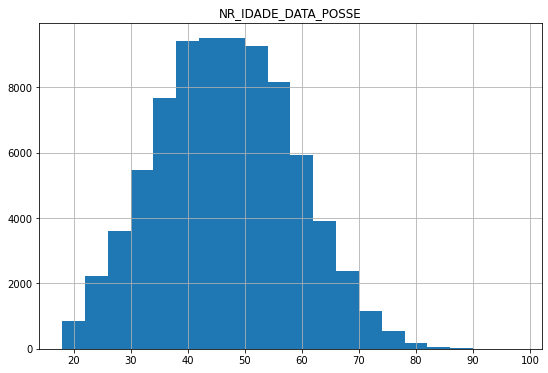

In [62]:
eleicao3.hist(column='NR_IDADE_DATA_POSSE', figsize=(9,6), bins=20);     

In [63]:
proporcaoGenero = eleicao3.groupby(["DS_SIT_TOT_TURNO", "DS_CARGO", "DS_GENERO"]).size().reset_index(name="QUANTIDADE")

proporcaoGenero.sort_values(by=['DS_SIT_TOT_TURNO'])

,DS_SIT_TOT_TURNO,DS_CARGO,DS_GENERO,QUANTIDADE
0,ELEITO,PREFEITO,FEMININO,61
1,ELEITO,PREFEITO,MASCULINO,790
2,ELEITO,VEREADOR,FEMININO,1182
3,ELEITO,VEREADOR,MASCULINO,7298
4,ELEITO,VICE-PREFEITO,FEMININO,107
5,ELEITO,VICE-PREFEITO,MASCULINO,744
6,NÃO ELEITO,PREFEITO,FEMININO,227
7,NÃO ELEITO,PREFEITO,MASCULINO,1664
8,NÃO ELEITO,VEREADOR,FEMININO,5400
9,NÃO ELEITO,VEREADOR,MASCULINO,9862


In [64]:
proporcaoGenero = eleicao3.groupby(["DS_SIT_TOT_TURNO", "DS_GENERO"]).size().reset_index(name="QUANTIDADE")

proporcaoGenero.sort_values(by=['DS_SIT_TOT_TURNO'])

,DS_SIT_TOT_TURNO,DS_GENERO,QUANTIDADE
0,ELEITO,FEMININO,1350
1,ELEITO,MASCULINO,8832
2,NÃO ELEITO,FEMININO,5991
3,NÃO ELEITO,MASCULINO,13053
4,SUPLENTE,FEMININO,19008
5,SUPLENTE,MASCULINO,31639


In [65]:
proporcaoEscolaridade = eleicao3.groupby(["DS_SIT_TOT_TURNO","DS_GRAU_INSTRUCAO"]).size().reset_index(name="QUANTIDADE")

proporcaoEscolaridade.sort_values(by=['DS_SIT_TOT_TURNO'])

,DS_SIT_TOT_TURNO,DS_GRAU_INSTRUCAO,QUANTIDADE
0,ELEITO,ENSINO FUNDAMENTAL COMPLETO,1247
1,ELEITO,ENSINO FUNDAMENTAL INCOMPLETO,1602
2,ELEITO,ENSINO MÉDIO COMPLETO,3510
3,ELEITO,ENSINO MÉDIO INCOMPLETO,454
4,ELEITO,LÊ E ESCREVE,216
5,ELEITO,SUPERIOR COMPLETO,2803
6,ELEITO,SUPERIOR INCOMPLETO,350
13,NÃO ELEITO,SUPERIOR INCOMPLETO,836
12,NÃO ELEITO,SUPERIOR COMPLETO,4214
11,NÃO ELEITO,LÊ E ESCREVE,880


In [66]:
nomesSociais = eleicao3['NM_SOCIAL_CANDIDATO'].unique()
nomesSociais = nomesSociais.tolist()

nomesSociais.remove("#NULO#")
nomesSociais.remove("NÃO DIVULGÁVEL")

print("\nTotal dos nomes sociais:", len(nomesSociais))

nomesSociais


Total dos nomes sociais: 20


['LORRAYNE COELHO',
 'RANNEY MENDES SILVA',
 'LUANA EMERENCIANO',
 'RHIELLY GOMES BARCARO',
 'ANDRÉ SILVA OLIVEIRA',
 'JAMÍLY SILVÉRIO DO CARMO',
 'AYSLA LIARAH CARVALHO',
 'EDNA LUIZA BULGARELLI IDE',
 'ANDRESSA MARINA FERREIRA',
 'ALESSANDRA PEREIRA GOMES',
 'RHAUHANNA FARIAS GONÇALVES',
 'JULIA GUIMARÃES',
 'LETICIA FERREIRA DE SOUZA',
 'ARIELLA SOUZA DUTRA',
 'MAMUSKA OLIVEIRA GOMES',
 'JULIANA CARLA DOS SANTOS',
 'RAYCA TEIXEIRA VIANA',
 'ANA LUZ FLORES SILVA',
 'LARA FABIA CANDIDA PEREIRA',
 'REBECA BORGES GONÇALVES']

In [67]:
proporcaoRaca = eleicao3.groupby(["DS_SIT_TOT_TURNO","DS_COR_RACA"]).size().reset_index(name="QUANTIDADE")

proporcaoRaca.sort_values(by=['DS_SIT_TOT_TURNO'])

,DS_SIT_TOT_TURNO,DS_COR_RACA,QUANTIDADE
0,ELEITO,AMARELA,36
1,ELEITO,BRANCA,5768
2,ELEITO,INDÍGENA,9
3,ELEITO,NÃO INFORMADO,108
4,ELEITO,PARDA,3584
5,ELEITO,PRETA,677
11,NÃO ELEITO,PRETA,2667
10,NÃO ELEITO,PARDA,7258
9,NÃO ELEITO,NÃO INFORMADO,313
8,NÃO ELEITO,INDÍGENA,16


#Preparação para NAIVE BAYES e RANDOM FOREST

Construo o dataframe final com o label tratado separado dos atributos escolhidos:

In [68]:
label = eleicao3['DS_SIT_TOT_TURNO']

atributos = pd.DataFrame()
atributos['genero'] = eleicao3['DS_GENERO']  
atributos['estado_civil'] = eleicao3['DS_ESTADO_CIVIL'] 
atributos['cor_raca'] = eleicao3['DS_COR_RACA'] 
atributos['cargo'] = eleicao3['DS_CARGO'] 
atributos['grau_instrucao'] = eleicao3['DS_GRAU_INSTRUCAO'] 

atributos.head()

,genero,estado_civil,cor_raca,cargo,grau_instrucao
0,MASCULINO,CASADO(A),BRANCA,VEREADOR,ENSINO FUNDAMENTAL INCOMPLETO
1,MASCULINO,DIVORCIADO(A),BRANCA,VEREADOR,ENSINO FUNDAMENTAL COMPLETO
2,MASCULINO,CASADO(A),PRETA,VEREADOR,ENSINO MÉDIO COMPLETO
3,MASCULINO,SOLTEIRO(A),BRANCA,VEREADOR,ENSINO MÉDIO COMPLETO
4,MASCULINO,CASADO(A),PRETA,VEREADOR,LÊ E ESCREVE


In [69]:
print ("{0} Registros e {1} colunas".format(atributos.shape[0], atributos.shape[1]))

79873 Registros e 5 colunas


Eu transponho os atributos (.T) e transformo em dicionário todos os valores (79873). 

Depois transformo eles em dummies (0 e 1 para cada combinação de valores únicos), pois é a forma que o Naive Bayes aceita de entrada:



In [70]:
dicionarioAtributos = atributos.T.to_dict().values()
dicionarioAtributos

dict_values([{'genero': 'MASCULINO', 'estado_civil': 'CASADO(A)', 'cor_raca': 'BRANCA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO FUNDAMENTAL INCOMPLETO'}, {'genero': 'MASCULINO', 'estado_civil': 'DIVORCIADO(A)', 'cor_raca': 'BRANCA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO FUNDAMENTAL COMPLETO'}, {'genero': 'MASCULINO', 'estado_civil': 'CASADO(A)', 'cor_raca': 'PRETA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO MÉDIO COMPLETO'}, {'genero': 'MASCULINO', 'estado_civil': 'SOLTEIRO(A)', 'cor_raca': 'BRANCA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO MÉDIO COMPLETO'}, {'genero': 'MASCULINO', 'estado_civil': 'CASADO(A)', 'cor_raca': 'PRETA', 'cargo': 'VEREADOR', 'grau_instrucao': 'LÊ E ESCREVE'}, {'genero': 'MASCULINO', 'estado_civil': 'SOLTEIRO(A)', 'cor_raca': 'PARDA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO FUNDAMENTAL INCOMPLETO'}, {'genero': 'MASCULINO', 'estado_civil': 'CASADO(A)', 'cor_raca': 'BRANCA', 'cargo': 'VEREADOR', 'grau_instrucao': 'ENSINO FUNDAME

In [71]:
vect = DictVectorizer(sparse=False) 

binarizadoAtributos = vect.fit_transform(dicionarioAtributos)

print("Shape após binarizacao/dummerização: {0}".format(binarizadoAtributos.shape), '\n')

binarizadoAtributos

Shape após binarizacao/dummerização: (79873, 23) 



array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 1., 0.]])

Novas colunas que foram criadas, sendo seus valores agora 0 e 1:

In [72]:
vect.feature_names_

['cargo=PREFEITO',
 'cargo=VEREADOR',
 'cargo=VICE-PREFEITO',
 'cor_raca=AMARELA',
 'cor_raca=BRANCA',
 'cor_raca=INDÍGENA',
 'cor_raca=NÃO INFORMADO',
 'cor_raca=PARDA',
 'cor_raca=PRETA',
 'estado_civil=CASADO(A)',
 'estado_civil=DIVORCIADO(A)',
 'estado_civil=SEPARADO(A) JUDICIALMENTE',
 'estado_civil=SOLTEIRO(A)',
 'estado_civil=VIÚVO(A)',
 'genero=FEMININO',
 'genero=MASCULINO',
 'grau_instrucao=ENSINO FUNDAMENTAL COMPLETO',
 'grau_instrucao=ENSINO FUNDAMENTAL INCOMPLETO',
 'grau_instrucao=ENSINO MÉDIO COMPLETO',
 'grau_instrucao=ENSINO MÉDIO INCOMPLETO',
 'grau_instrucao=LÊ E ESCREVE',
 'grau_instrucao=SUPERIOR COMPLETO',
 'grau_instrucao=SUPERIOR INCOMPLETO']

Binarizo o label também:

In [73]:
labelEncoder = LabelEncoder()
binarizadoLabel = labelEncoder.fit_transform(label)

print("Labels: {0}, \nClasses: {1}".format(binarizadoLabel, labelEncoder.classes_))

Labels: [2 2 2 ... 2 2 2], 
Classes: ['ELEITO' 'NÃO ELEITO' 'SUPLENTE']


Divido a base em treino e teste, sendo 20% teste e 80% treino. 

O random_state é 0 para sempre começar do mesmo ponto:

In [74]:
X_train, X_test, Y_train, Y_test = train_test_split(binarizadoAtributos, binarizadoLabel, random_state=0, test_size=0.20)

print ("O shape de cada um é:  {0},  {1},  {2},  {3}".format(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape))

O shape de cada um é:  (63898, 23),  (15975, 23),  (63898,),  (15975,)


#NAIVE BAYES
Treino o Naive Bayes com a base de treino:

In [75]:
naiveBayes = GaussianNB() 
naiveBayes = naiveBayes.fit(X_train, Y_train)

Faço uma previsão com a base de teste:

In [76]:
Y_predNaiveBayes = naiveBayes.predict(X_test)
Y_predNaiveBayes

array([2, 2, 1, ..., 2, 2, 2])

Comparo o que foi previsto com os labels reais que tenho e vejo quantos erros ele teve na previsão:

In [77]:
(Y_test != Y_predNaiveBayes).sum()

5186

Analisando a matriz de confusão:

In [78]:
matrizConfusao = confusion_matrix(Y_test, Y_predNaiveBayes)
pd.DataFrame(data=matrizConfusao, index=labelEncoder.classes_, columns=[x + "(prev)" for x in labelEncoder.classes_])

,ELEITO(prev),NÃO ELEITO(prev),SUPLENTE(prev)
ELEITO,269,86,1681
NÃO ELEITO,449,286,2966
SUPLENTE,0,4,10234


Analisando a acurácia do método:

In [79]:
print("Acurácia no treino:", naiveBayes.score(X_train, Y_train))

print("Acurácia no teste:", naiveBayes.score(X_test, Y_test))

Acurácia no treino: 0.6654355378885098
Acurácia no teste: 0.6753677621283255


#RANDOM FOREST

Treino com Random Forest e 10 classificadores:


In [80]:
randomForest = RandomForestClassifier(n_estimators=10, random_state=0)

randomForest.fit(X_train, Y_train)

RandomForestClassifier(n_estimators=10, random_state=0)

Faço a previsão do Y_pred:

In [81]:
Y_predRandomForest = randomForest.predict(X_test)

Y_predRandomForest

array([2, 2, 0, ..., 2, 2, 2])

Comparo o que foi previsto com os labels reais que tenho, vendo novamente quantos erros tive:

In [82]:
(Y_test != Y_predRandomForest).sum()

5023

Análise da acurácia:

In [83]:
print("Acurácia no treino:", randomForest.score(X_train, Y_train))

print("Acurácia no teste:", randomForest.score(X_test, Y_test))

Acurácia no treino: 0.6809915803311528
Acurácia no teste: 0.6855712050078248


Matriz de confusão para o Random Forest:

In [84]:
matrizConfusao = confusion_matrix(Y_test, Y_predRandomForest)
pd.DataFrame(data=matrizConfusao, index=labelEncoder.classes_, columns=[x + "(prev)" for x in labelEncoder.classes_])

,ELEITO(prev),NÃO ELEITO(prev),SUPLENTE(prev)
ELEITO,6,350,1680
NÃO ELEITO,13,730,2958
SUPLENTE,1,21,10216


#NAIVE BAYES e RANDOM FOREST - 2º TESTE

Adicionando 2 atributos novos:


In [85]:
atributos['agremiacao'] = eleicao3['TP_AGREMIACAO']

atributos['nacionalidade'] = eleicao3['DS_NACIONALIDADE']

atributos.head()

,genero,estado_civil,cor_raca,cargo,grau_instrucao,agremiacao,nacionalidade
0,MASCULINO,CASADO(A),BRANCA,VEREADOR,ENSINO FUNDAMENTAL INCOMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
1,MASCULINO,DIVORCIADO(A),BRANCA,VEREADOR,ENSINO FUNDAMENTAL COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
2,MASCULINO,CASADO(A),PRETA,VEREADOR,ENSINO MÉDIO COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
3,MASCULINO,SOLTEIRO(A),BRANCA,VEREADOR,ENSINO MÉDIO COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
4,MASCULINO,CASADO(A),PRETA,VEREADOR,LÊ E ESCREVE,PARTIDO ISOLADO,BRASILEIRA NATA


Criando funções para não repetir novamente os mesmos códigos:

In [86]:
def binarizar(atributos):
  dicionarioAtributos = atributos.T.to_dict().values()

  vect = DictVectorizer(sparse=False) 

  binarizadoAtributos = vect.fit_transform(dicionarioAtributos)

  return {
          'vect': vect, 
          'binarizacao' : binarizadoAtributos
          }


def diferenca(Y_test, Y_pred):
  return (Y_test != Y_pred).sum()


def printAcuracia(treino, teste, diferenca):
  print("Acurácia no treino {0}, no teste {1}, diferença {2}\n".format (treino, teste, diferenca))

Nova binarização com mais variaveis:

In [87]:
resultado = binarizar(atributos)

resultado['vect'].feature_names_

['agremiacao=COLIGAÇÃO',
 'agremiacao=PARTIDO ISOLADO',
 'cargo=PREFEITO',
 'cargo=VEREADOR',
 'cargo=VICE-PREFEITO',
 'cor_raca=AMARELA',
 'cor_raca=BRANCA',
 'cor_raca=INDÍGENA',
 'cor_raca=NÃO INFORMADO',
 'cor_raca=PARDA',
 'cor_raca=PRETA',
 'estado_civil=CASADO(A)',
 'estado_civil=DIVORCIADO(A)',
 'estado_civil=SEPARADO(A) JUDICIALMENTE',
 'estado_civil=SOLTEIRO(A)',
 'estado_civil=VIÚVO(A)',
 'genero=FEMININO',
 'genero=MASCULINO',
 'grau_instrucao=ENSINO FUNDAMENTAL COMPLETO',
 'grau_instrucao=ENSINO FUNDAMENTAL INCOMPLETO',
 'grau_instrucao=ENSINO MÉDIO COMPLETO',
 'grau_instrucao=ENSINO MÉDIO INCOMPLETO',
 'grau_instrucao=LÊ E ESCREVE',
 'grau_instrucao=SUPERIOR COMPLETO',
 'grau_instrucao=SUPERIOR INCOMPLETO',
 'nacionalidade=BRASILEIRA (NATURALIZADA)',
 'nacionalidade=BRASILEIRA NATA',
 'nacionalidade=ESTRANGEIRO',
 'nacionalidade=PORTUGUESA COM IGUALDADE DE DIREITOS']

In [88]:
def treinarPreverMedir(binarizacao, binarizadoLabel, estimatores = 10, test_size=0.30):
  
  X_train, X_test, Y_train, Y_test = train_test_split(binarizacao, binarizadoLabel, random_state=0, test_size=test_size)

  #Naive Bayes
  naiveBayes = GaussianNB() 
  naiveBayes = naiveBayes.fit(X_train, Y_train)

  Y_predNaiveBayes = naiveBayes.predict(X_test)

  #Random Forest
  randomForest = RandomForestClassifier(estimatores, random_state=0)

  randomForest.fit(X_train, Y_train)

  Y_predRandomForest = randomForest.predict(X_test)

  #Análises
  printAcuracia(naiveBayes.score(X_train, Y_train), naiveBayes.score(X_test, Y_test), diferenca(Y_test, Y_predNaiveBayes))

  printAcuracia(randomForest.score(X_train, Y_train), randomForest.score(X_test, Y_test), diferenca(Y_test, Y_predRandomForest))

In [89]:
treinarPreverMedir(resultado['binarizacao'], binarizadoLabel)

Acurácia no treino 0.6544687091985477, no teste 0.660837993489692, diferença 8127

Acurácia no treino 0.6818336284452076, no teste 0.6834154077289041, diferença 7586



Misturando aleatoriamente os registros do dataframe:

In [100]:
atributos1 = atributos.sample(frac=1)
atributos1.head()

,genero,estado_civil,cor_raca,cargo,grau_instrucao,agremiacao,nacionalidade
63600,MASCULINO,SOLTEIRO(A),PRETA,VEREADOR,ENSINO MÉDIO INCOMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
79473,MASCULINO,CASADO(A),PARDA,VEREADOR,SUPERIOR COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
80352,MASCULINO,DIVORCIADO(A),PARDA,VEREADOR,ENSINO MÉDIO COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
24895,MASCULINO,DIVORCIADO(A),BRANCA,VEREADOR,ENSINO MÉDIO COMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA
48258,MASCULINO,SOLTEIRO(A),PRETA,VEREADOR,ENSINO FUNDAMENTAL INCOMPLETO,PARTIDO ISOLADO,BRASILEIRA NATA


Prevendo com a mistura da base:

In [101]:
resultado = binarizar(atributos1)

treinarPreverMedir(resultado['binarizacao'], binarizadoLabel)

Acurácia no treino 0.23705532006224178, no teste 0.23119939904849346, diferença 18422

Acurácia no treino 0.6345978430004829, no teste 0.6354644854352726, diferença 8735

